<a href="https://colab.research.google.com/github/zt55699/IMDB-Sentiment/blob/main/IMDB_Sentiment_Analysis_SENG474.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Loading dataset

In [3]:
%rm -rf IMDB-Sentiment
!git clone https://github.com/zt55699/IMDB-Sentiment.git
%cd IMDB-Sentiment/
%ls

Cloning into 'IMDB-Sentiment'...
remote: Enumerating objects: 11, done.
remote: Counting objects: 100% (11/11), done.
remote: Compressing objects: 100% (9/9), done.
remote: Total 11 (delta 2), reused 7 (delta 1), pack-reused 0
Unpacking objects: 100% (11/11), done.
/content/IMDB-Sentiment
labeledTrainData.tsv  SENG474_Word2Vec.ipynb  unlabeledTrainData.tsv
README.md             testData.tsv


In [4]:
import pandas as pd

# Read data from files 
train_data = pd.read_csv( "labeledTrainData.tsv", header=0, delimiter="\t", quoting=3 )
test_data = pd.read_csv( "testData.tsv", header=0, delimiter="\t", quoting=3 )
unlabeled_train = pd.read_csv( "unlabeledTrainData.tsv", header=0, delimiter="\t", quoting=3 )

In [5]:
print(train_data.head)
print(test_data.head)

<bound method NDFrame.head of               id  sentiment                                             review
0       "5814_8"          1  "With all this stuff going down at the moment ...
1       "2381_9"          1  "\"The Classic War of the Worlds\" by Timothy ...
2       "7759_3"          0  "The film starts with a manager (Nicholas Bell...
3       "3630_4"          0  "It must be assumed that those who praised thi...
4       "9495_8"          1  "Superbly trashy and wondrously unpretentious ...
...          ...        ...                                                ...
24995   "3453_3"          0  "It seems like more consideration has gone int...
24996   "5064_1"          0  "I don't believe they made this film. Complete...
24997  "10905_3"          0  "Guy is a loser. Can't get girls, needs to bui...
24998  "10194_3"          0  "This 30 minute documentary Buñuel made in the...
24999   "8478_8"          1  "I saw this movie as a child and it broke my h...

[25000 rows x 3 colum

# Data Cleaning 

Gensim preprocessing doc: https://radimrehurek.com/gensim/parsing/preprocessing.html

In [6]:
import gensim.parsing.preprocessing as gp
from gensim.parsing.preprocessing import preprocess_string
from gensim.parsing.preprocessing import remove_stopwords

# Cast words to lower case; remove HTML tags, puctuation, numbers, short words and meaningless stopwords
# Use Porter Stemming e.g. treat "go", "going", and "went" as the same word
# Remove stop words here, which are the noise for later average vector
FILTERS = [lambda x: x.lower(), gp.strip_tags, gp.strip_punctuation, 
           gp.strip_multiple_whitespaces, gp.strip_short , gp.stem_text,
           gp.remove_stopwords, gp.strip_numeric] # maybe not remove number as well

# clean a sentence, return a list of words
def clean_sentence(raw_sentence):
  return preprocess_string(raw_sentence, FILTERS)

r1 = train_data["review"][0]
print("Before: ", r1)
print("After: ", clean_sentence(r1))

Before:  "With all this stuff going down at the moment with MJ i've started listening to his music, watching the odd documentary here and there, watched The Wiz and watched Moonwalker again. Maybe i just want to get a certain insight into this guy who i thought was really cool in the eighties just to maybe make up my mind whether he is guilty or innocent. Moonwalker is part biography, part feature film which i remember going to see at the cinema when it was originally released. Some of it has subtle messages about MJ's feeling towards the press and also the obvious message of drugs are bad m'kay.<br /><br />Visually impressive but of course this is all about Michael Jackson so unless you remotely like MJ in anyway then you are going to hate this and find it boring. Some may call MJ an egotist for consenting to the making of this movie BUT MJ and most of his fans would say that he made it for the fans which if true is really nice of him.<br /><br />The actual feature film bit when it fi

### Feature selection

In [7]:
def clean_df(df):
  count = 0
  dfc = df.copy()
  reviews = dfc["review"]
  for sentence in reviews:
        sentence = clean_sentence(sentence)
        dfc["review"].loc[count] = sentence
        count+=1
  return dfc

In [8]:
df = clean_df(train_data)
print(df["sentiment"][0])

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


1


In [9]:
# get the list of most frequent words in both class
from collections import Counter
import itertools

pos_df = df.loc[df['sentiment'] == 1]
neg_df = df.loc[df['sentiment'] == 0]
pos_arr = pos_df["review"].tolist()
neg_arr = neg_df["review"].tolist()

all_words_pos = []
all_words_neg = []

for i in range (len(pos_arr)):
  all_words_pos+=pos_arr[i]
for i in range (len(neg_arr)):
  all_words_neg+=neg_arr[i]

pos_freqs = dict(zip(Counter(all_words_pos).keys(), Counter(all_words_pos).values()))
pos_freqs = dict(sorted(pos_freqs.items(), key=lambda item: item[1], reverse=True))
pos_largest_freqs = dict(itertools.islice(pos_freqs.items(), 15))

neg_freqs = dict(zip(Counter(all_words_neg).keys(), Counter(all_words_neg).values()))
neg_freqs = dict(sorted(neg_freqs.items(), key=lambda item: item[1], reverse=True))
neg_largest_freqs = dict(itertools.islice(neg_freqs.items(), 15))

print("Positive reviews:")
for key, value in pos_largest_freqs.items():
  print(" ",key,":", value)

print("\nNegative reviews:")
for key, value in neg_largest_freqs.items():
  print(" ",key,":", value)

#df_freq.nlargest(10, 'frequency')

Positive reviews:
  thi : 35071
  film : 25299
  movi : 22654
  wa : 21914
  hi : 17224
  ar : 14811
  like : 10456
  thei : 9893
  ha : 9185
  time : 8494
  veri : 8302
  good : 7840
  stori : 7479
  charact : 7071
  watch : 6553

Negative reviews:
  thi : 40897
  movi : 29032
  wa : 26282
  film : 22885
  ar : 14623
  thei : 13012
  like : 12339
  hi : 12144
  time : 7692
  ha : 7601
  good : 7520
  bad : 7430
  watch : 7386
  charact : 7102
  onli : 6778


positive


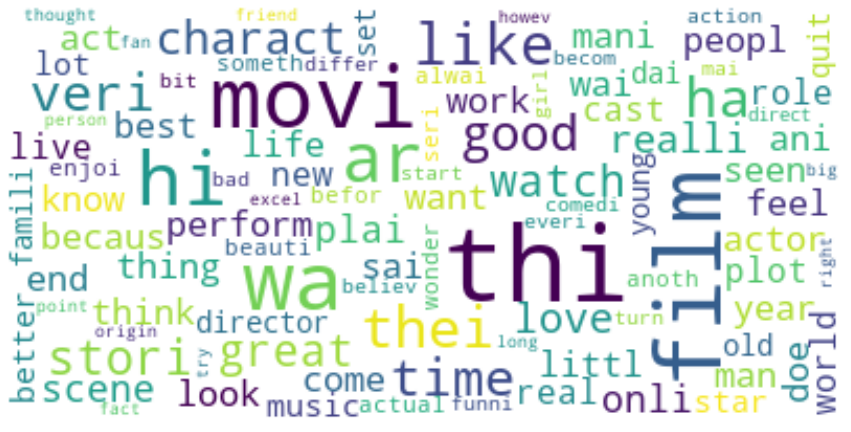

negative


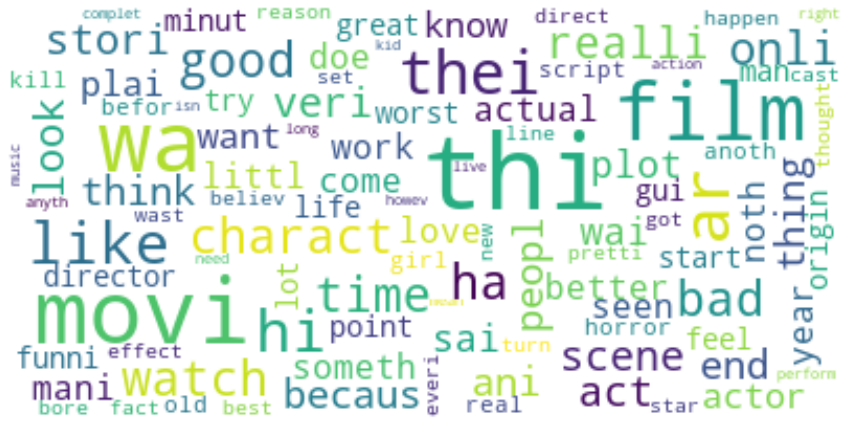

In [11]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt
%matplotlib inline  

textpos = " ".join(pos_freqs.keys())
textneg = " ".join(neg_freqs.keys())
# Create a word cloud for psitive words

pos_wordcloud = WordCloud(max_font_size=50, max_words=100, background_color="white").generate_from_frequencies(pos_freqs)
neg_wordcloud = WordCloud(max_font_size=50, max_words=100, background_color="white").generate_from_frequencies(neg_freqs)

print("positive")
plt.figure(figsize=(15, 15))
plt.imshow(pos_wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()

print("negative")
plt.figure(figsize=(15, 15))
plt.imshow(neg_wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()

In [12]:
reduced_pos = pos_freqs.copy()
reduced_neg = neg_freqs.copy()
keys_to_remove = ['film','movi','thi','wa', 'ar', 'time', 'thei', 'hi', 'ha','end']
for k in keys_to_remove:
  if k in reduced_pos: del reduced_pos[k]
  if k in reduced_neg: del reduced_neg[k]

pos_largest_freqs = dict(itertools.islice(reduced_pos.items(), 10))
neg_largest_freqs = dict(itertools.islice(reduced_neg.items(), 10))

print("Positive reviews:")
for key, value in pos_largest_freqs.items():
  print(" ",key,":", value)

print("\nNegative reviews:")
for key, value in neg_largest_freqs.items():
  print(" ",key,":", value)

Positive reviews:
  like : 10456
  veri : 8302
  good : 7840
  stori : 7479
  charact : 7071
  watch : 6553
  great : 6487
  love : 6168
  realli : 5474
  onli : 5136

Negative reviews:
  like : 12339
  good : 7520
  bad : 7430
  watch : 7386
  charact : 7102
  onli : 6778
  realli : 6262
  look : 5874
  veri : 5762
  stori : 5688


# Data Pre-processing

** This block is for Word2Vec use. Doc2Vec has its own data pre-processing method in its section

Word2Vec expects single sentences as inputs, each one as a list of words. 

In [14]:
from gensim.summarization.textcleaner import split_sentences

# split a review by sentences, return a list of sentences, for each is a list of words
def split_review (raw_review):
  raw_sentences = split_sentences(raw_review)
  clean_sentences = []
  for s in raw_sentences:
    if len(s) > 0:
      clean_sentences.append( clean_sentence(s))
  return clean_sentences

print("Before: ", r1)
print("After: ", split_review(r1))

Before:  "With all this stuff going down at the moment with MJ i've started listening to his music, watching the odd documentary here and there, watched The Wiz and watched Moonwalker again. Maybe i just want to get a certain insight into this guy who i thought was really cool in the eighties just to maybe make up my mind whether he is guilty or innocent. Moonwalker is part biography, part feature film which i remember going to see at the cinema when it was originally released. Some of it has subtle messages about MJ's feeling towards the press and also the obvious message of drugs are bad m'kay.<br /><br />Visually impressive but of course this is all about Michael Jackson so unless you remotely like MJ in anyway then you are going to hate this and find it boring. Some may call MJ an egotist for consenting to the making of this movie BUT MJ and most of his fans would say that he made it for the fans which if true is really nice of him.<br /><br />The actual feature film bit when it fi

In [15]:
# prepare input data for Word2Vec (takes couple minutes):
all_sentences = []  

print(f'Parsing {len(train_data["review"])} sentences from training set...')
train_size = len(train_data["review"])
for i in range (0, train_size):
    # report progress
    progress = (i+1)/train_size *100
    if( progress%20 == 0 ):
        print(f'   {progress}%')  
    all_sentences += split_review( train_data["review"][i])

print("Total labeled:", len(all_sentences), "sentences")

Parsing 25000 sentences from training set...
   20.0%
   40.0%
   60.0%
   80.0%
   100.0%
Total labeled: 265041 sentences


In [16]:
#merge with unlabeles data
print(f'Parsing {len(unlabeled_train["review"])} sentences from unlabeled set...')
unlabel_size = len(unlabeled_train["review"])
for i in range (0, unlabel_size):
    # report progress
    progress = (i+1)/unlabel_size *100
    if( progress%20 == 0 ):
        print(f'   {progress}%')  
    all_sentences += split_review(unlabeled_train["review"][i])

Parsing 50000 sentences from unlabeled set...
   20.0%
   40.0%
   60.0%
   80.0%
   100.0%


In [17]:
print("Total:", len(all_sentences), "sentences")
print(all_sentences[0])

Total: 792761 sentences
['thi', 'stuff', 'moment', 'start', 'listen', 'hi', 'music', 'watch', 'odd', 'documentari', 'watch', 'wiz', 'watch', 'moonwalk']


In [18]:
ave_len = sum([len(s) for s in all_sentences])/len(all_sentences)
print("Average sentence length:", ave_len)

Average sentence length: 10.991364358236593


# Word Embedding

## 1. Word2Vec 

In [19]:
# Output messages for training
from gensim.models import word2vec
import logging
import sys

logging.basicConfig(
    format='%(asctime)s [%(levelname)s] %(name)s - %(message)s',
    level=logging.INFO,
    datefmt='%Y-%m-%d %H:%M:%S',
    stream=sys.stdout,
)
log = logging.getLogger('notebook')

# parameters
num_features = 300    # Word vector dimensionality                      
min_word_count = 40   # Minimum word count                        
num_workers = 4       # Number of threads to run in parallel
context = 10          # Context window size                                                                                    
downsampling = 1e-3   # Downsample setting for frequent words

# model training
word2vec_model = word2vec.Word2Vec(all_sentences, workers=num_workers, 
            size=num_features, min_count = min_word_count, 
            window = context, sample = downsampling)

word2vec_model.init_sims(replace=True) # internally calculates unit-length normalized vectors

2021-04-06 17:22:34 [INFO] gensim.models.word2vec - collecting all words and their counts
2021-04-06 17:22:34 [INFO] gensim.models.word2vec - PROGRESS: at sentence #0, processed 0 words, keeping 0 word types
2021-04-06 17:22:34 [INFO] gensim.models.word2vec - PROGRESS: at sentence #10000, processed 111865 words, keeping 12374 word types
2021-04-06 17:22:34 [INFO] gensim.models.word2vec - PROGRESS: at sentence #20000, processed 223633 words, keeping 17075 word types
2021-04-06 17:22:34 [INFO] gensim.models.word2vec - PROGRESS: at sentence #30000, processed 332303 words, keeping 20504 word types
2021-04-06 17:22:34 [INFO] gensim.models.word2vec - PROGRESS: at sentence #40000, processed 443349 words, keeping 23280 word types
2021-04-06 17:22:34 [INFO] gensim.models.word2vec - PROGRESS: at sentence #50000, processed 553570 words, keeping 25640 word types
2021-04-06 17:22:34 [INFO] gensim.models.word2vec - PROGRESS: at sentence #60000, processed 662342 words, keeping 27632 word types
2021-0

In [20]:
# save model to drive for later use OPTIONAL
from google.colab import drive
drive.mount('/content/drive')

def save_model(model, name):
  model_save_name = f'{name}({num_features},{min_word_count},{context})'
  path = f"/content/drive/MyDrive/{model_save_name}" 
  model.save(path)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [21]:
save_model(word2vec_model, "Word2Vec")

2021-04-06 17:24:39 [INFO] gensim.utils - saving Word2Vec object under /content/drive/MyDrive/Word2Vec(300,40,10), separately None
2021-04-06 17:24:39 [INFO] gensim.utils - not storing attribute vectors_norm
2021-04-06 17:24:39 [INFO] gensim.utils - not storing attribute cum_table
2021-04-06 17:24:41 [INFO] gensim.utils - saved /content/drive/MyDrive/Word2Vec(300,40,10)


load saved Word2Vec model

In [24]:
# mount google drive to load pre-saved model
import pandas as pd
import numpy as np
from gensim.models import Word2Vec
from google.colab import drive
drive.mount('/content/drive',  force_remount=True)
%cd ~/../content/drive/MyDrive
%ls

Mounted at /content/drive
/content/drive/MyDrive
'Assistive Tech for Mental Health'@
 cleaned_processed.cleveland.data
'Colab Notebooks'/
'Copy of ideation-assessment-group5.gsheet'
'Copy of unconstrained-design-design-groupX.gslides'
'CSC370 AS1.drawio'
 CSC474A1_neural_networks.ipynb
 CSC474A1_random_forest.ipynb
'CSC485D Visual Interim Presentation.gslides'
'Data Mining Lab 1'@
'Data Mining Lab 1 - Jan 22nd by Keon  (1).ipynb'
'Doc2Vec(300,40,10)'
 IMDB-Sentiment/
'Lab2 MLP.ipynb'
'Lab4 - Logistic Regression .ipynb'
'Learning Roadmap.drawio'
'Project Evaluation (8% of total 40% project grade, due 7pm Sunday March 15th by email).gdoc'
'Status report.gslides'
'Untitled Diagram (1).drawio'
'Untitled Diagram.drawio'
'Word2Vec(300,40,10)'


In [ ]:
# load trained model OPTIONAL
word2vec_model = Word2Vec.load("Word2Vec(300,40,10)")
word2vec_model.trainables.syn1neg.shape

In [25]:
word2vec_model.wv["man"] # word vec

array([-0.14635928,  0.02817144,  0.01662509,  0.03621269,  0.01070696,
       -0.02455155,  0.01114403,  0.0926017 , -0.05687091, -0.01770316,
       -0.01627582,  0.06479632, -0.09631527,  0.02818746,  0.04185979,
        0.09599353,  0.05120325,  0.05172807,  0.06294103,  0.03920318,
        0.01071209,  0.02164694,  0.10831546,  0.03996372, -0.04173177,
       -0.01104093,  0.04755406,  0.00540239,  0.04715062, -0.01791382,
        0.03889775, -0.01059198, -0.01800688, -0.02477338,  0.1256306 ,
        0.01042607,  0.06833421, -0.07625538,  0.04084248, -0.03393453,
        0.01509661, -0.0319956 , -0.01454709, -0.0583577 ,  0.00946201,
        0.04213778, -0.07753584, -0.10849121, -0.03884654, -0.02823022,
        0.00199057, -0.03335601,  0.05779327, -0.00595719,  0.06049959,
       -0.01450762,  0.04607873, -0.05901548,  0.07024591, -0.0315196 ,
       -0.05842204, -0.01190979, -0.01531898,  0.02620875,  0.02518168,
       -0.09213646,  0.05480993,  0.10129295,  0.03663183,  0.06

In [26]:
word2vec_model.wv.most_similar("woman")

[('women', 0.604878842830658),
 ('giovanna', 0.5889941453933716),
 ('ladi', 0.5833135843276978),
 ('whore', 0.5764822959899902),
 ('loretta', 0.5749840140342712),
 ('widow', 0.5607701539993286),
 ('prostitut', 0.5558592081069946),
 ('housewif', 0.5468395352363586),
 ('gino', 0.5406866669654846),
 ('husband', 0.5389603972434998)]

In [27]:
word2vec_model.wv.most_similar("good")

[('decent', 0.6699329614639282),
 ('great', 0.5976845026016235),
 ('bad', 0.5830103754997253),
 ('alright', 0.5578131675720215),
 ('nice', 0.5513320565223694),
 ('okai', 0.49335619807243347),
 ('fine', 0.4920569062232971),
 ('cool', 0.49159806966781616),
 ('lousi', 0.48526471853256226),
 ('fair', 0.479944109916687)]

### Word encoding visualization

Visualization of Word Embedding Vectors using Gensim and PCA 
link:https://towardsdatascience.com/visualization-of-word-embedding-vectors-using-gensim-and-pca-8f592a5d3354

In [28]:
X=word2vec_model[word2vec_model.wv.vocab]

df=pd.DataFrame(X)

num_rows = df.shape[0]

df.index = list(word2vec_model.wv.vocab)

df.shape
df.head()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  """Entry point for launching an IPython kernel.


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,...,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299
thi,0.069500,-0.070706,-0.079334,-0.018785,0.005682,-0.027645,0.066010,0.031523,-0.017251,-0.069674,0.125132,0.034927,-0.003043,0.047381,-0.004103,0.027528,0.048657,-0.026112,-0.100667,0.001602,0.006177,0.054148,-0.000362,-0.082853,0.088799,-0.054264,-0.044763,0.080994,0.002447,0.074948,0.016962,0.020552,-0.093627,0.013102,0.053308,-0.004727,-0.021365,-0.009876,0.055248,-0.088738,...,-0.119133,-0.009268,0.006852,-0.032583,0.058992,0.012137,0.006855,0.054284,0.132098,0.081037,-0.078570,-0.007553,-0.051945,-0.057628,0.026707,0.082844,-0.021989,-0.084743,-0.000193,-0.121501,-0.025677,-0.102148,0.030875,-0.022692,-0.115670,0.056248,0.024638,0.005733,-0.045132,-0.009376,-0.048124,0.108508,-0.086614,-0.086356,0.053040,0.070084,0.061355,0.022580,0.164478,0.104664
stuff,-0.020591,0.084969,-0.054981,-0.040788,-0.021725,-0.026119,0.019324,-0.024671,0.060967,-0.064454,0.050581,-0.008046,0.078346,-0.078412,0.034029,-0.043662,-0.040362,0.027973,-0.093254,0.035980,0.023835,-0.047351,-0.098440,0.080026,0.130666,0.081137,0.112146,-0.059909,-0.129267,0.062894,-0.018979,0.037994,-0.002989,0.064286,-0.013733,0.109309,-0.025498,0.008047,0.025752,-0.018064,...,0.040387,-0.052227,0.043009,-0.012394,0.054756,0.120158,0.119089,0.004452,-0.057745,0.089480,0.050804,0.094047,-0.040292,-0.056074,-0.053668,0.020560,-0.014477,0.053031,0.033538,0.030572,0.041120,-0.015985,-0.062937,0.003585,-0.071177,-0.006536,0.001246,-0.014058,-0.095196,-0.146901,-0.041094,-0.018927,0.038099,0.004936,-0.003302,-0.036569,0.008546,-0.035292,0.075696,0.023272
moment,0.119584,0.005292,-0.145774,0.000629,-0.070638,0.033359,0.047334,-0.021151,-0.010712,-0.002940,0.180763,-0.111723,0.062022,0.022736,0.056630,-0.053008,-0.033592,-0.023266,-0.046036,-0.019414,0.032740,-0.032333,-0.079114,0.034415,-0.055253,0.094443,0.068129,-0.082005,0.088473,-0.030143,0.068964,-0.068326,0.035097,-0.040892,0.032553,0.023392,0.008698,-0.009477,-0.006742,-0.028400,...,0.006927,-0.051095,-0.043755,0.078502,0.098172,-0.147520,0.044435,0.040855,-0.074574,-0.161021,-0.021641,-0.015873,0.007833,0.092938,0.061966,0.104350,-0.029347,0.020844,0.062271,0.005593,-0.009937,0.090848,0.022504,-0.057510,-0.012114,-0.063077,-0.019505,-0.127319,-0.014307,0.018738,-0.003920,0.002041,-0.015272,-0.005380,-0.026257,-0.024759,-0.003204,-0.029485,0.058577,0.002411
start,-0.010253,-0.028118,0.034175,0.006277,0.009512,0.029251,-0.047883,-0.042272,0.083173,-0.033892,0.152884,0.041082,0.054831,0.098407,-0.183169,-0.053591,0.128955,0.002905,0.023553,-0.045020,-0.007179,-0.054459,0.073714,-0.018853,0.194216,-0.056320,-0.051751,0.050695,0.023661,-0.040554,-0.144820,-0.013496,-0.097150,0.020974,0.050347,0.054691,0.005785,-0.079734,-0.070620,0.026092,...,0.017020,0.025483,0.013846,0.000135,0.063083,-0.040855,-0.073343,-0.077383,0.103358,-0.012268,0.045701,-0.055180,0.035481,0.052536,-0.005634,-0.006430,0.053245,0.001445,0.027961,0.064087,0.034734,0.019166,-0.048122,-0.084375,-0.022994,0.038241,-0.014513,-0.021149,-0.016844,0.026946,0.020247,0.013602,-0.037866,-0.025988,0.078354,-0.051619,-0.044299,-0.023853,-0.053582,0.010605
listen,-0.065028,-0.104217,0.027046,0.020566,0.089352,-0.050613,-0.042136,-0.025510,0.034315,0.047597,0.071052,-0.068149,0.040030,0.023593,-0.005478,0.039897,-0.028991,-0.013805,0.051534,0.061390,0.038506,-0.096012,-0.134586,0.076930,0.012612,0.107310,-0.005670,0.022660,0.020725,-0.081438,-0.053002,0.006978,-0.018483,-0.007217,-0.004962,0.005034,-0.002651,-0.016066,-0.099616,-0.017318,...,0.043613,0.035501,-0.074287,0.031153,0.081029,-0.027917,-0.079145,-0.032311,0.058805,0.031812,-0.046949,-0.000583,0.051316,-0.002213,0.031856,0.079323,-0.008929,0.044748,-0.034174,0.075422,-0.009506,0.012270,-0.063775,-0.065798,-0.074628,-0.092415,0.0494

In [29]:
#Computing the correlation matrix
X_corr=df.corr()

#Computing eigen values and eigen vectors
values,vectors=np.linalg.eig(X_corr)

#Sorting the eigen vectors coresponding to eigen values in descending order
args = (-values).argsort()
values = vectors[args]
vectors = vectors[:, args]

#Taking first 2 components which explain maximum variance for projecting
new_vectors=vectors[:,:2]

#Projecting it onto new dimesion with 2 axis
neww_X=np.dot(X,new_vectors)

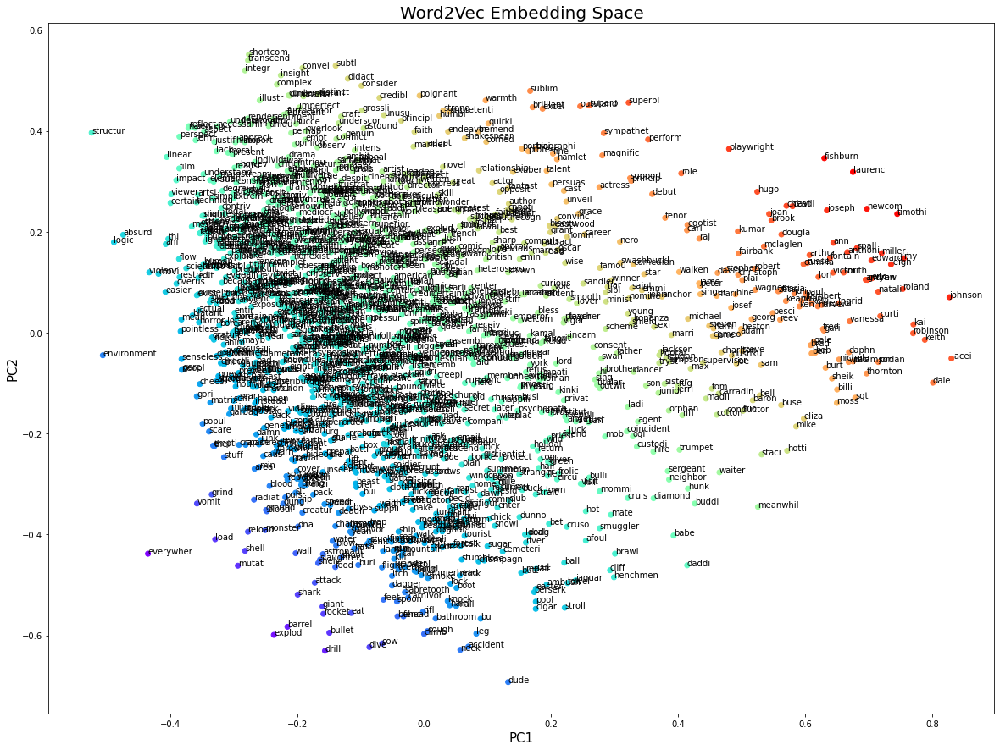

In [30]:
import matplotlib.pyplot as plt
num_of_words = 1500 #Number of words to draw

plt.figure(figsize=(20,15))
plt.scatter(neww_X[:num_of_words,0],neww_X[:num_of_words,1],linewidths=1,
            c = (neww_X[:num_of_words,0]+neww_X[:num_of_words,1]), cmap = "rainbow")
plt.xlabel("PC1",size=15)
plt.ylabel("PC2",size=15)
plt.title("Word2Vec Embedding Space",size=20)
vocab=list(word2vec_model.wv.vocab)[:num_of_words]

for i, word in enumerate(vocab):
  plt.annotate(word,xy=(neww_X[i,0],neww_X[i,1]))

## 2. Doc2Vec


Gensim Doc2Vec doc https://radimrehurek.com/gensim/models/doc2vec.html

Doc2Vec preprocessing

In [31]:
import gensim.utils
from gensim.models.doc2vec import Doc2Vec, TaggedDocument

# prepare input data for Doc2Vec (takes couple minutes):
taggeddoc = []  

print(f'Parsing {len(train_data["review"])} sentences from training set...')
train_size = len(train_data["review"])
for i in range (0, train_size):
    # report progress
    progress = (i+1)/train_size *100
    if( progress%20 == 0 ):
        print(f'   {progress}%')  
    clean_r = clean_sentence( train_data["review"][i])
    taggeddoc.append(TaggedDocument(gensim.utils.to_unicode(str.encode(' '.join(clean_r))).split(),str(i)))

print(f'Parsing {len(unlabeled_train["review"])} sentences from unlabeled_train set...')
unlabeled_train_size = len(unlabeled_train["review"])
for i in range (0, unlabeled_train_size):
    # report progress
    progress = (i+1)/unlabeled_train_size *100
    if( progress%20 == 0 ):
        print(f'   {progress}%')  
    clean_r = clean_sentence( unlabeled_train["review"][i])
    taggeddoc.append(TaggedDocument(gensim.utils.to_unicode(str.encode(' '.join(clean_r))).split(),str(i)))

Parsing 25000 sentences from training set...
   20.0%
   40.0%
   60.0%
   80.0%
   100.0%
Parsing 50000 sentences from unlabeled_train set...
   20.0%
   40.0%
   60.0%
   80.0%
   100.0%


Doc2Vec training

In [32]:
import logging
import sys

# output messages
logging.basicConfig(
    format='%(asctime)s [%(levelname)s] %(name)s - %(message)s',
    level=logging.INFO,
    datefmt='%Y-%m-%d %H:%M:%S',
    stream=sys.stdout,
)
log = logging.getLogger('notebook')

# parameters
num_features = 300    # Word vector dimensionality                      
min_word_count = 40   # Minimum word count                        
num_workers = 4       # Number of threads to run in parallel
context = 10          # Context window size - smaller window size gives results that are more syntactic in nature. Larger window ( size > 5 ) gives results that are more semantic - this takes more training time given larger window size.                                                                                   
downsampling = 1e-3   # Downsample setting for frequent words

# model training
doc2vec_model = Doc2Vec(taggeddoc, workers=num_workers, 
                        vector_size= num_features, min_count = min_word_count, 
                        window = context, sample = downsampling)


2021-04-06 17:28:36 [INFO] gensim.models.doc2vec - collecting all words and their counts
2021-04-06 17:28:36 [INFO] gensim.models.doc2vec - PROGRESS: at example #0, processed 0 words (0/s), 0 word types, 0 tags
2021-04-06 17:28:36 [INFO] gensim.models.doc2vec - PROGRESS: at example #10000, processed 1169086 words (2577741/s), 34946 word types, 10 tags
2021-04-06 17:28:36 [INFO] gensim.models.doc2vec - PROGRESS: at example #20000, processed 2322701 words (2401048/s), 46493 word types, 10 tags
2021-04-06 17:28:37 [INFO] gensim.models.doc2vec - PROGRESS: at example #30000, processed 3474171 words (2464642/s), 57058 word types, 10 tags
2021-04-06 17:28:37 [INFO] gensim.models.doc2vec - PROGRESS: at example #40000, processed 4634266 words (2475686/s), 66247 word types, 10 tags
2021-04-06 17:28:38 [INFO] gensim.models.doc2vec - PROGRESS: at example #50000, processed 5809170 words (2318464/s), 74232 word types, 10 tags
2021-04-06 17:28:38 [INFO] gensim.models.doc2vec - PROGRESS: at example #6

In [33]:
#save trained Doc2Vec_model to google drive for later use
save_model(doc2vec_model, "Doc2Vec")

2021-04-06 17:32:05 [INFO] gensim.utils - saving Doc2Vec object under /content/drive/MyDrive/Doc2Vec(300,40,10), separately None
2021-04-06 17:32:07 [INFO] gensim.utils - saved /content/drive/MyDrive/Doc2Vec(300,40,10)


In [34]:
doc2vec_model.wv.most_similar("woman")

2021-04-06 17:32:07 [INFO] gensim.models.keyedvectors - precomputing L2-norms of word weight vectors


[('loretta', 0.539722204208374),
 ('ladi', 0.5233503580093384),
 ('women', 0.5130327343940735),
 ('nubil', 0.5006006956100464),
 ('husband', 0.4939934313297272),
 ('sylvia', 0.47812244296073914),
 ('frigid', 0.4726155996322632),
 ('kristel', 0.45567837357521057),
 ('widow', 0.4536786675453186),
 ('seduc', 0.44992589950561523)]

###Word encoding visualization

Visualization of Word Embedding Vectors using Gensim and PCA 
link:https://towardsdatascience.com/visualization-of-word-embedding-vectors-using-gensim-and-pca-8f592a5d3354

In [35]:
X=doc2vec_model[doc2vec_model.wv.vocab]

df=pd.DataFrame(X)

num_rows = df.shape[0]

df.index = list(doc2vec_model.wv.vocab)

df.shape
df.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,...,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299
thi,0.169211,0.193949,-0.667072,0.582677,0.019764,0.200738,0.480285,-0.651291,-0.651305,-0.579609,-0.599060,0.190859,0.658015,0.882886,0.426172,0.207012,0.027206,0.105956,0.677508,-0.000562,-0.692008,0.709692,-0.563219,-1.006279,-0.721908,0.116228,0.344636,0.616525,0.059799,0.692212,0.860373,-0.753443,-0.406724,-0.436884,0.002086,-1.074796,-0.035978,0.670399,0.764486,-1.633248,...,-0.147528,-0.405118,-0.149788,0.106879,-1.007624,-0.131174,0.085689,0.056217,0.247575,-0.355966,-0.785577,-0.679838,-0.067024,-0.231841,0.267243,0.752831,-0.357631,-0.696965,0.223184,-1.112806,-0.049003,-0.339727,0.145959,-0.129555,-0.694228,-0.339128,0.029892,0.399616,-0.127539,0.289191,-0.009754,-0.293630,-0.120928,-0.102833,0.118365,-0.584741,-1.018477,-0.229031,-0.015827,0.411059
stuff,-0.209564,0.678347,-0.430880,0.676798,-0.067498,0.351470,0.660350,0.415823,0.004109,-0.189601,0.096486,-1.067926,0.238902,0.697779,-1.467212,0.358395,-0.698491,-0.451014,0.319993,0.502788,-0.282502,-0.475092,0.240638,0.821114,0.941364,0.090369,0.718841,-0.851901,0.028022,0.779810,-1.061032,-0.486623,1.086307,0.967633,-0.120173,-0.484750,-0.431220,0.294770,0.499835,0.530195,...,0.016157,-1.100056,0.332260,-0.106056,1.120367,1.619011,0.171697,0.407875,-0.420907,0.941873,0.061821,1.143545,0.531567,-0.478311,-0.472666,-0.058342,-0.851824,1.662023,0.075397,0.264694,0.330012,0.526096,-0.259398,0.828386,-1.181902,0.079693,0.682744,0.106348,-1.392835,-1.366454,0.514597,-0.298927,0.304250,0.530824,0.584953,-0.749083,0.672305,-0.278543,-0.603708,-1.684229
moment,0.081430,-1.036644,-1.341209,1.113033,-0.910635,0.882141,1.113242,0.415682,-0.480173,-0.526477,0.820694,-1.231465,-0.152510,1.094550,-0.681040,0.797834,-0.938654,0.375291,-0.222488,1.102715,1.207766,0.156388,-0.807381,-0.352341,0.020645,1.138189,0.827951,-0.858939,0.524364,-0.627442,0.005797,-0.412597,0.557248,-0.450608,-0.581096,-1.378810,-1.409531,-0.264676,-0.585421,-0.717291,...,0.819692,-0.329244,0.290451,0.297339,2.009224,-0.997452,-0.554918,1.395634,-1.536391,-0.851813,0.046612,-0.318952,0.181988,1.653810,0.427694,0.425388,-1.553212,0.659706,-1.051319,-1.554726,-0.717455,1.609062,0.469115,-0.303462,-0.857434,0.253374,0.417429,-0.152418,0.220811,-1.165837,0.873408,-0.729674,-1.260798,-0.526704,0.089365,0.955128,-0.684462,-1.055308,0.079687,0.397554
start,-1.126988,0.702039,1.574189,1.855261,1.531630,-0.741841,-0.072133,-1.160170,0.730927,0.532482,-1.138142,0.834377,-0.003518,2.087395,-0.723713,-0.080230,2.248878,0.291170,0.588563,-0.096814,0.443110,-0.492998,0.959708,-1.278429,-0.408915,-0.980884,0.186919,-0.755849,-0.289337,-1.407248,-1.498363,0.502985,-0.701914,0.167305,-0.654765,1.764575,0.055924,0.318075,-0.964246,1.141110,...,-0.616735,-0.710112,0.302112,0.470679,0.612567,-1.019025,-0.188304,-1.223401,1.245107,0.457552,-0.950284,1.440785,0.701331,1.393366,-0.983757,1.115787,-1.691487,0.998102,-0.582686,0.239234,1.604061,-0.753029,-1.464103,-0.135332,-0.310675,0.631258,-0.110914,-0.784364,0.568558,-1.444638,0.645578,-0.914806,-0.850707,-0.258714,-0.382325,-0.588670,0.427074,0.201147,-0.191813,-0.367735
listen,0.804204,-1.248305,-2.106844,-1.028455,0.821375,0.762512,-0.507087,-0.151692,-0.311738,2.048113,0.992926,-0.840977,0.216058,0.232447,0.829509,0.545969,-0.871509,-1.424144,1.803782,1.073408,0.438098,-0.070517,-2.184349,0.851245,0.340074,0.854157,-0.140142,-0.234677,0.871458,0.060666,-1.140091,0.550576,-0.481540,-0.909493,-2.479731,2.609870,0.072342,0.697875,-1.780557,0.683536,...,0.334817,-0.876240,-0.705319,1.050448,0.370758,-0.387417,-0.345276,-0.061125,-0.512547,-0.010626,0.540857,0.117654,0.179386,-0.072911,-0.493199,-1.041788,-0.534044,0.257434,-0.645176,-0.104783,-0.534375,0.275356,0.007955,-0.154939,-0.060843,-0.252697,-0.0094

In [36]:
#Computing the correlation matrix
X_corr=df.corr()

#Computing eigen values and eigen vectors
values,vectors=np.linalg.eig(X_corr)

#Sorting the eigen vectors coresponding to eigen values in descending order
args = (-values).argsort()
values = vectors[args]
vectors = vectors[:, args]

#Taking first 2 components which explain maximum variance for projecting
new_vectors=vectors[:,:2]

#Projecting it onto new dimesion with 2 axis
neww_X=np.dot(X,new_vectors)

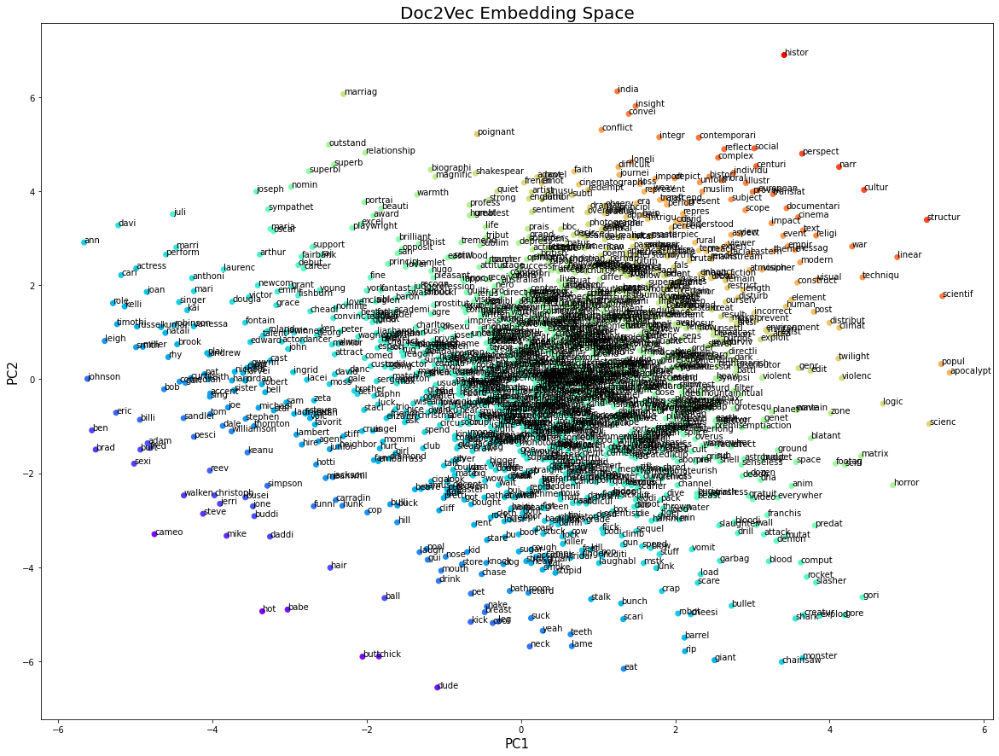

In [37]:
import matplotlib.pyplot as plt
num_of_words = 1500 #Number of words to draw

plt.figure(figsize=(20,15))
plt.scatter(neww_X[:num_of_words,0],neww_X[:num_of_words,1],linewidths=1,
            c = (neww_X[:num_of_words,0]+neww_X[:num_of_words,1]), cmap = "rainbow")
plt.xlabel("PC1",size=15)
plt.ylabel("PC2",size=15)
plt.title("Doc2Vec Embedding Space",size=20)
vocab=list(doc2vec_model.wv.vocab)[:num_of_words]

for i, word in enumerate(vocab):
  plt.annotate(word,xy=(neww_X[i,0],neww_X[i,1]))

##Window Size Exploration

The Gensim default window size is 5 (two words before and two words after the input word, in addition to the input word itself).

In [38]:
def plot_encoding_space(wdmodel, name, pints_to_draw = 1500):
  X=wdmodel[wdmodel.wv.vocab]
  df=pd.DataFrame(X)
  num_rows = df.shape[0]
  df.index = list(wdmodel.wv.vocab)

  X_corr=df.corr()
  values,vectors=np.linalg.eig(X_corr)
  args = (-values).argsort()
  values = vectors[args]
  vectors = vectors[:, args]


  new_vectors=vectors[:,:2]
  neww_X=np.dot(X,new_vectors)

  plt.figure(figsize=(20,15))
  plt.scatter(neww_X[:pints_to_draw,0],neww_X[:pints_to_draw,1],linewidths=1,
              c = (neww_X[:pints_to_draw,0]+neww_X[:pints_to_draw,1]), cmap = "rainbow")
  plt.xlabel("PC1",size=15)
  plt.ylabel("PC2",size=15)
  plt.title(name,size=20)
  vocab=list(wdmodel.wv.vocab)[:pints_to_draw]

  for i, word in enumerate(vocab):
    plt.annotate(word,xy=(neww_X[i,0],neww_X[i,1]))

2021-04-06 17:32:20 [INFO] gensim.models.word2vec - collecting all words and their counts
2021-04-06 17:32:20 [INFO] gensim.models.word2vec - PROGRESS: at sentence #0, processed 0 words, keeping 0 word types
2021-04-06 17:32:20 [INFO] gensim.models.word2vec - PROGRESS: at sentence #10000, processed 111865 words, keeping 12374 word types
2021-04-06 17:32:20 [INFO] gensim.models.word2vec - PROGRESS: at sentence #20000, processed 223633 words, keeping 17075 word types
2021-04-06 17:32:20 [INFO] gensim.models.word2vec - PROGRESS: at sentence #30000, processed 332303 words, keeping 20504 word types
2021-04-06 17:32:20 [INFO] gensim.models.word2vec - PROGRESS: at sentence #40000, processed 443349 words, keeping 23280 word types
2021-04-06 17:32:20 [INFO] gensim.models.word2vec - PROGRESS: at sentence #50000, processed 553570 words, keeping 25640 word types
2021-04-06 17:32:20 [INFO] gensim.models.word2vec - PROGRESS: at sentence #60000, processed 662342 words, keeping 27632 word types
2021-0

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  


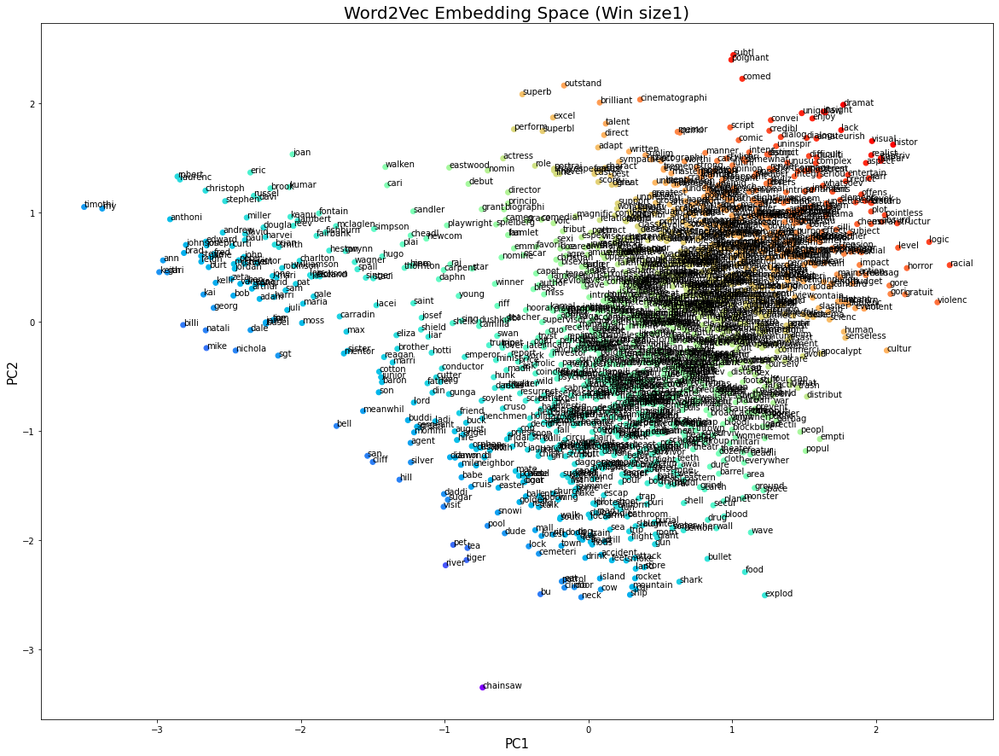

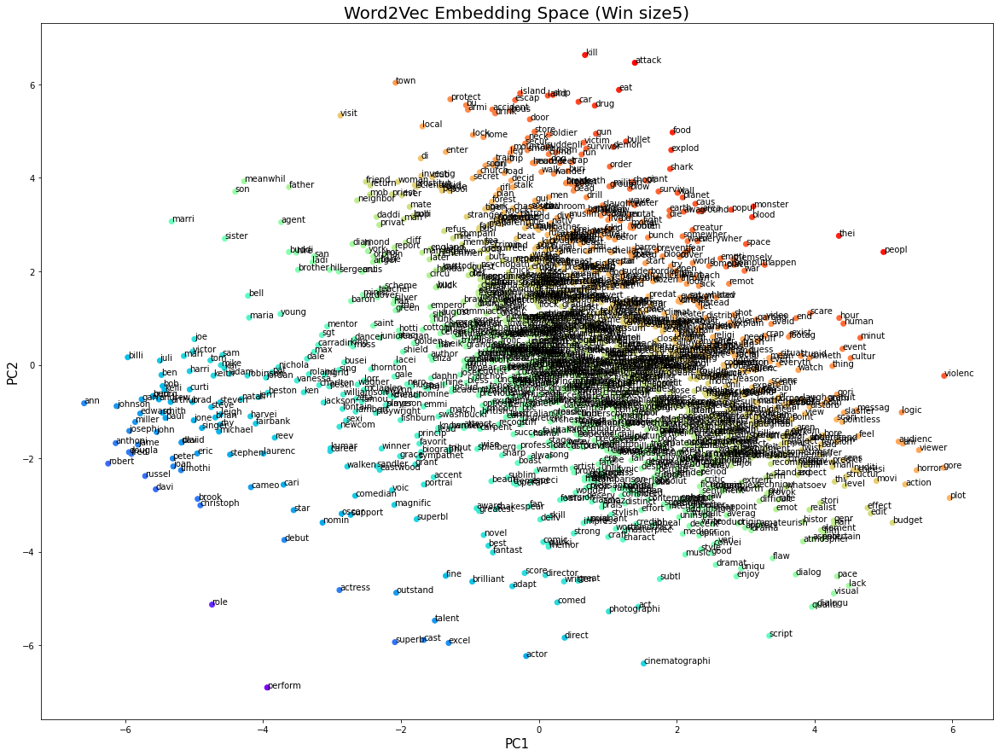

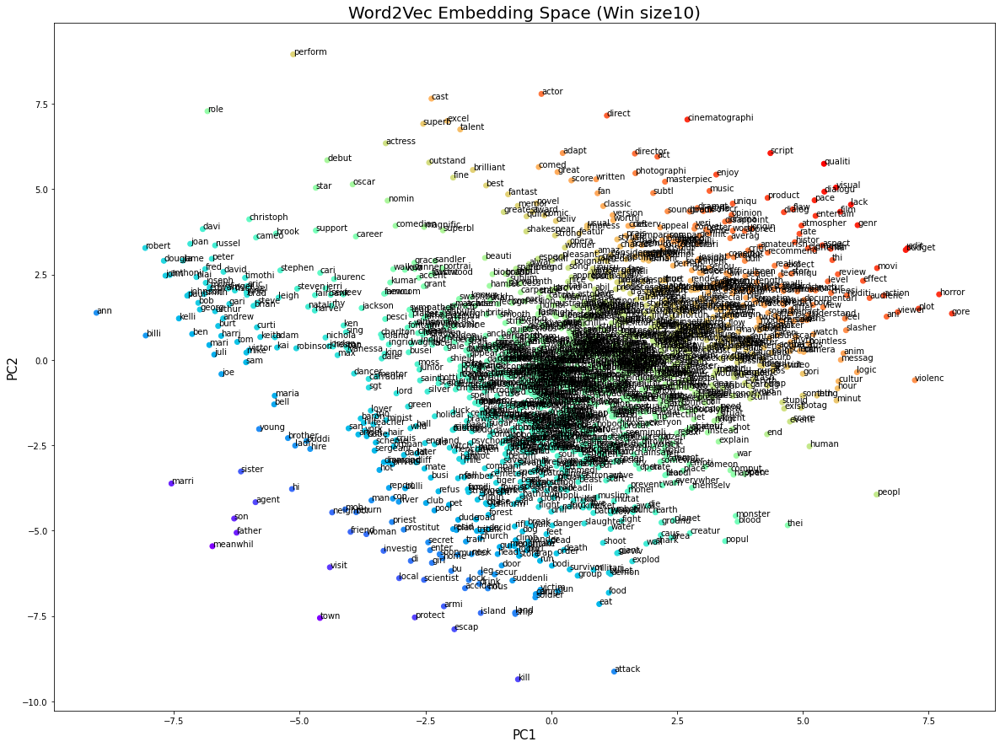

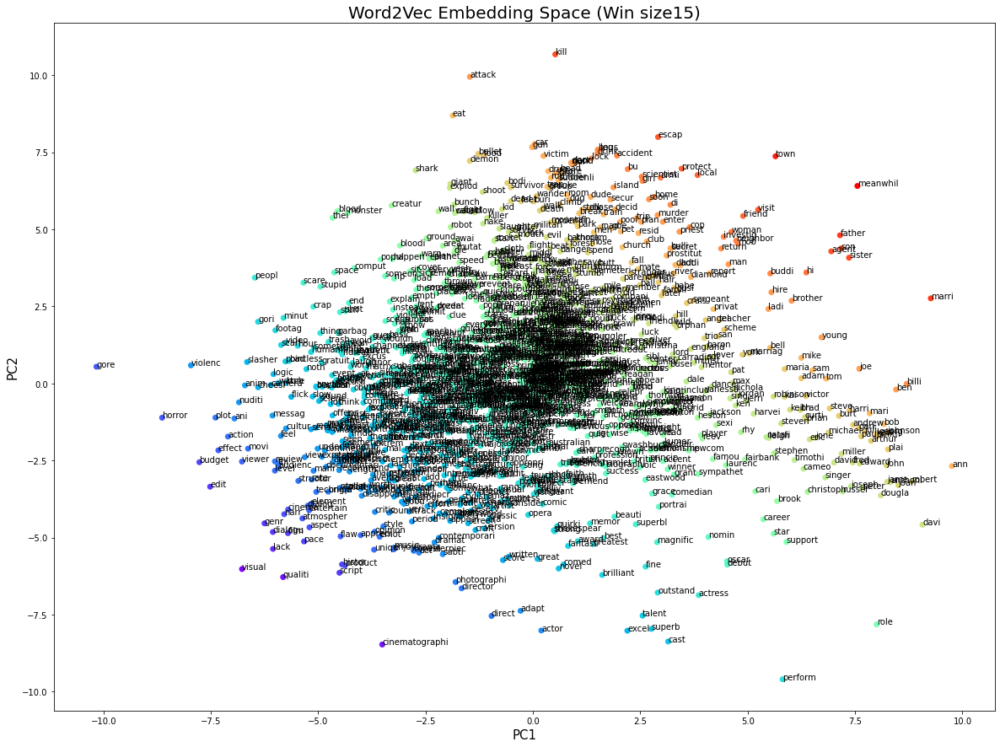

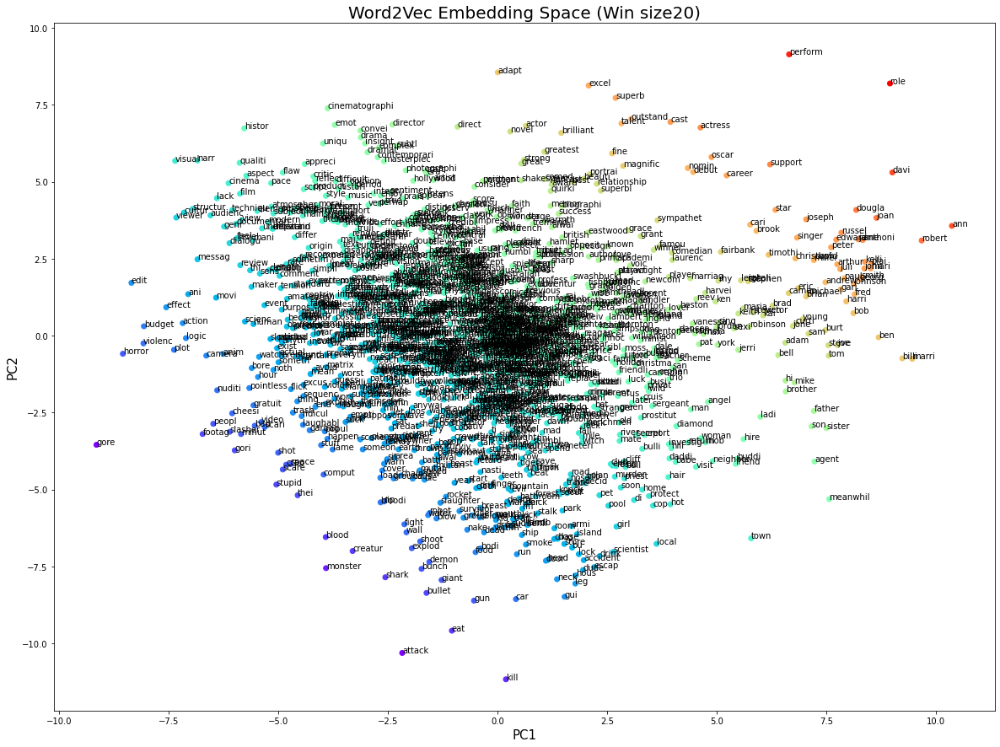

...

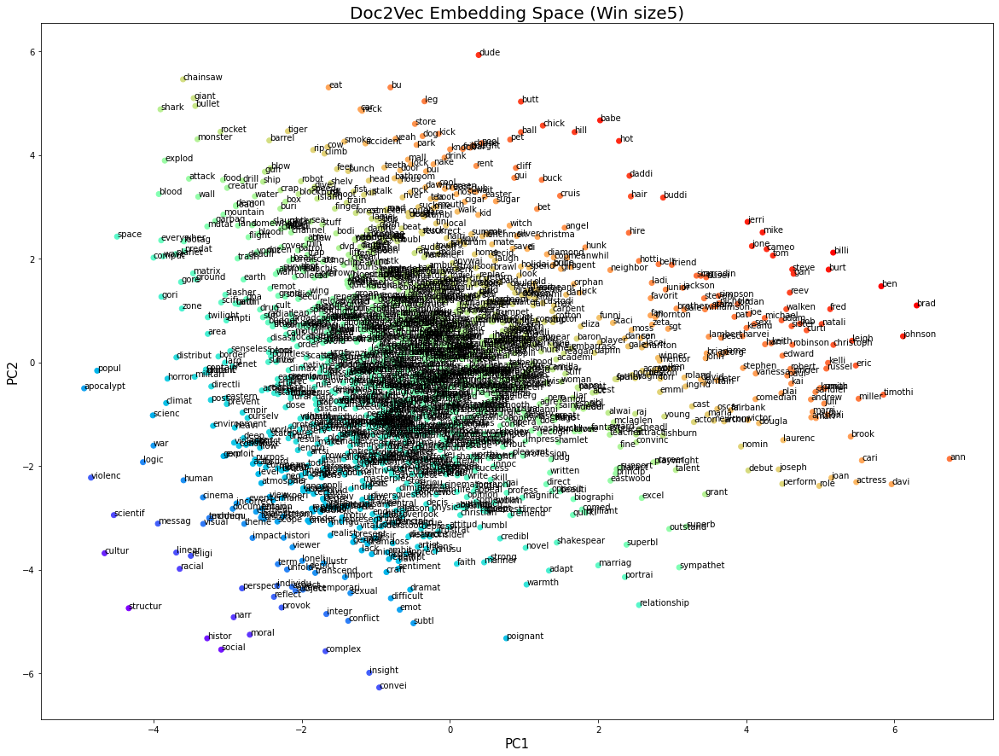

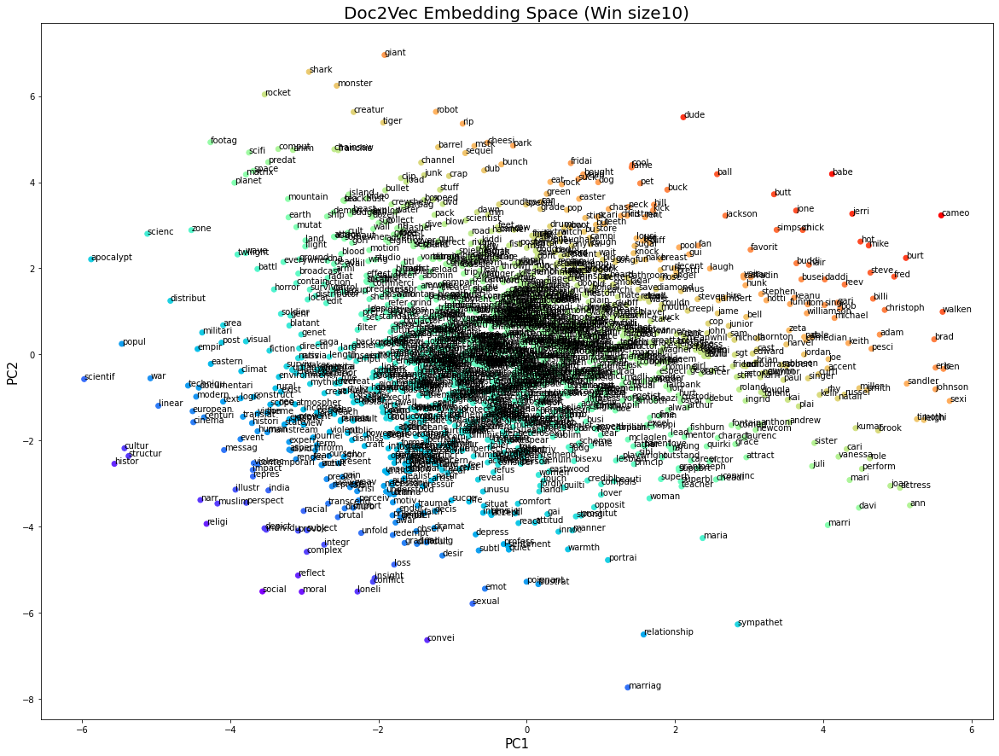

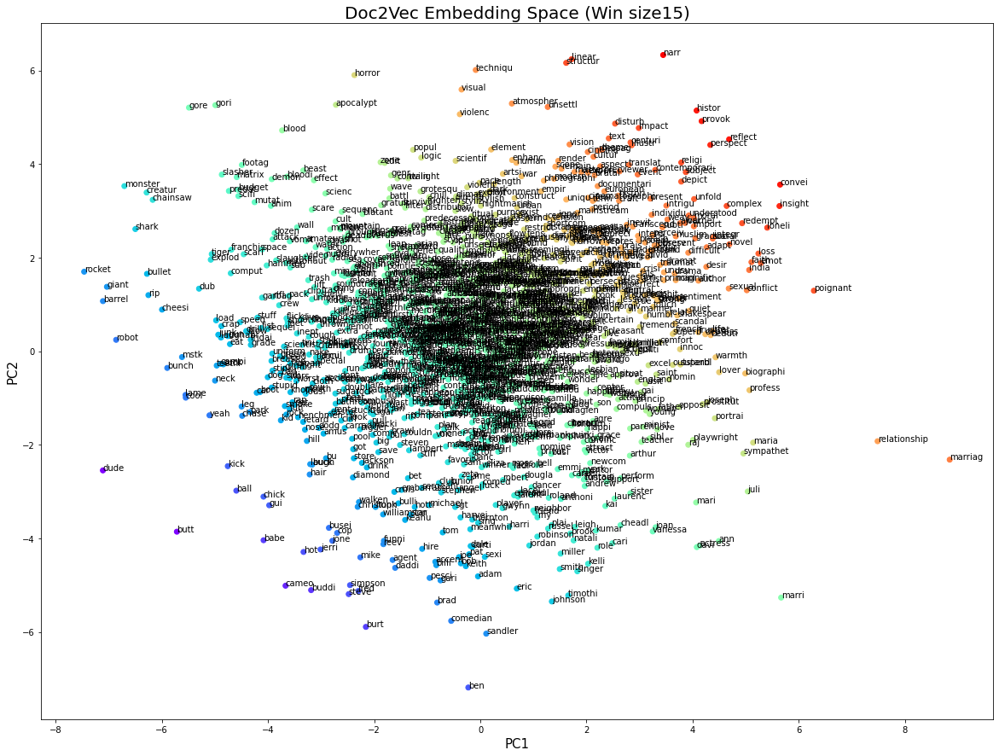

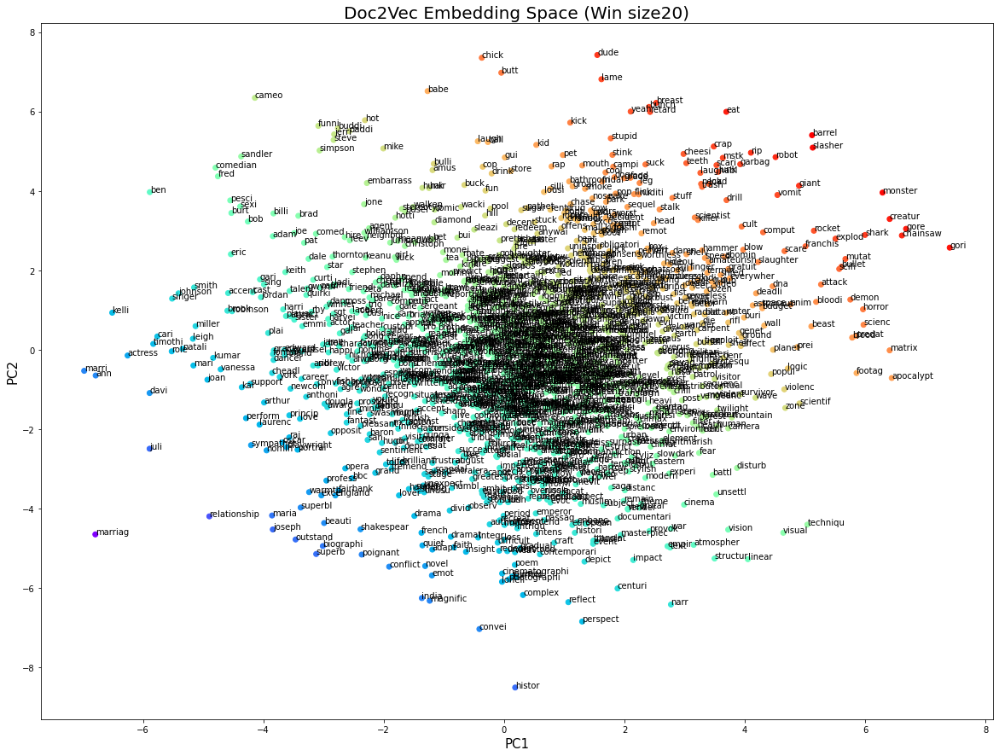

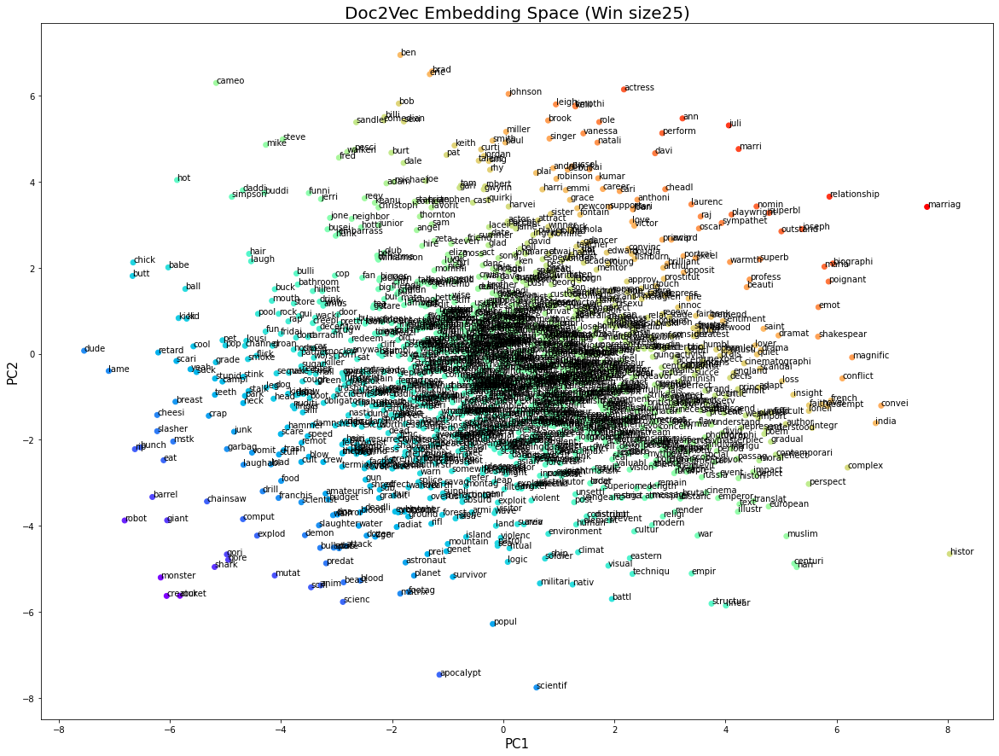

In [39]:
win_sizes = np.array([1,5,10,15,20,25])
word2vec_models = [word2vec.Word2Vec(all_sentences, workers=num_workers, 
                                      size=num_features, min_count = min_word_count, 
                                      window = win_s, sample = downsampling) 
                  for win_s in win_sizes]

doc2vec_models = [Doc2Vec(taggeddoc, workers=num_workers, 
                          vector_size= num_features, min_count = min_word_count, 
                          window = win_s, sample = downsampling)
                  for win_s in win_sizes]

for i in range(len(win_sizes)):
    plot_encoding_space(word2vec_models[i], "Word2Vec Embedding Space (Win size"+str(win_sizes[i])+")")

for i in range(len(win_sizes)):
    plot_encoding_space(doc2vec_models[i], "Doc2Vec Embedding Space (Win size"+str(win_sizes[i])+")")

# Building Feature Set

In [40]:
# same clean process apply to input data, keep consistent with the keys in encoding models vc dic
clean_reviews = []

for review in train_data["review"]:
  clean_reviews.append(clean_sentence(review))

get the feature set by averaging the word vectors in a single review

In [41]:
import numpy as np

# take a list of words as input, return average vector
def get_average_vec(review, model, n_features = num_features):
    vectorized = [model.wv[word] for word in review if word in model.wv.vocab]
    total = len(vectorized)
    sum_v = np.sum(vectorized, axis=0)
    average_v = np.divide(sum_v, total)
    return average_v

In [42]:
def to_feature_set(model, method, reviews):
  f_set = []
  train_size = len(reviews)
  print(f'Processing {train_size} training reviews...')
  
  for i in range (0, train_size):
    # report progress
    progress = (i+1)/train_size *100
    if( progress%20 == 0 ):
        print(f'   {progress}%')  

    avg_v = method(reviews[i], model)
    f_set.append(avg_v)
  return f_set

Same preprocessing as word2vec to keep input data format uniform

In [43]:
word2vec_train_reviews = to_feature_set(word2vec_model, get_average_vec, clean_reviews)

Processing 25000 training reviews...
   20.0%
   40.0%
   60.0%
   80.0%
   100.0%


In [44]:
doc2vec_train_reviews = to_feature_set(doc2vec_model, get_average_vec, clean_reviews)  

Processing 25000 training reviews...
   20.0%
   40.0%
   60.0%
   80.0%
   100.0%


Data preparation for window size tuning

In [45]:
word2vec_train_difWins = [to_feature_set(mod, get_average_vec, clean_reviews)
                            for mod in word2vec_models]

Processing 25000 training reviews...
   20.0%
   40.0%
   60.0%
   80.0%
   100.0%
Processing 25000 training reviews...
   20.0%
   40.0%
   60.0%
   80.0%
   100.0%
Processing 25000 training reviews...
   20.0%
   40.0%
   60.0%
   80.0%
   100.0%
Processing 25000 training reviews...
   20.0%
   40.0%
   60.0%
   80.0%
   100.0%
Processing 25000 training reviews...
   20.0%
   40.0%
   60.0%
   80.0%
   100.0%
Processing 25000 training reviews...
   20.0%
   40.0%
   60.0%
   80.0%
   100.0%


In [46]:
doc2vec_train_difWins =[to_feature_set(mod, get_average_vec, clean_reviews)
                            for mod in doc2vec_models]

Processing 25000 training reviews...
   20.0%
   40.0%
   60.0%
   80.0%
   100.0%
Processing 25000 training reviews...
   20.0%
   40.0%
   60.0%
   80.0%
   100.0%
Processing 25000 training reviews...
   20.0%
   40.0%
   60.0%
   80.0%
   100.0%
Processing 25000 training reviews...
   20.0%
   40.0%
   60.0%
   80.0%
   100.0%
Processing 25000 training reviews...
   20.0%
   40.0%
   60.0%
   80.0%
   100.0%
Processing 25000 training reviews...
   20.0%
   40.0%
   60.0%
   80.0%
   100.0%


# Classifier Modeling

In [47]:
# splitting train test sets; this block only prepare the word encoding models with win size = 5
from sklearn.model_selection import train_test_split

X_train1, X_test1, y_train1, y_test1 = train_test_split(word2vec_train_reviews, train_data["sentiment"], 
                                                    test_size=0.2, random_state=42)

X_train2, X_test2, y_train2, y_test2 = train_test_split(doc2vec_train_reviews, train_data["sentiment"], 
                                                    test_size=0.2, random_state=42)

In [48]:
# this block is for word encoding window size hyterparameter tuning
from sklearn.model_selection import train_test_split


X_trainw1, X_testw1, y_trainw1, y_testw1 = train_test_split(word2vec_train_difWins[0], train_data["sentiment"], 
                                                    test_size=0.2, random_state=42)
X_trainw5, X_testw5, y_trainw5, y_testw5 = train_test_split(word2vec_train_difWins[1], train_data["sentiment"], 
                                                    test_size=0.2, random_state=42)
X_trainw10, X_testw10, y_trainw10, y_testw10 = train_test_split(word2vec_train_difWins[2], train_data["sentiment"], 
                                                    test_size=0.2, random_state=42)
X_trainw15, X_testw15, y_trainw15, y_testw15 = train_test_split(word2vec_train_difWins[3], train_data["sentiment"], 
                                                    test_size=0.2, random_state=42)
X_trainw20, X_testw20, y_trainw20, y_testw20 = train_test_split(word2vec_train_difWins[4], train_data["sentiment"], 
                                                    test_size=0.2, random_state=42)
X_trainw25, X_testw25, y_trainw25, y_testw25 = train_test_split(word2vec_train_difWins[5], train_data["sentiment"], 
                                                    test_size=0.2, random_state=42)

X_traind1, X_testd1, y_traind1, y_testd1 = train_test_split(doc2vec_train_difWins[0], train_data["sentiment"], 
                                                    test_size=0.2, random_state=42)
X_traind5, X_testd5, y_traind5, y_testd5 = train_test_split(doc2vec_train_difWins[1], train_data["sentiment"], 
                                                    test_size=0.2, random_state=42)
X_traind10, X_testd10, y_traind10, y_testd10 = train_test_split(doc2vec_train_difWins[2], train_data["sentiment"], 
                                                    test_size=0.2, random_state=42)
X_traind15, X_testd15, y_traind15, y_testd15 = train_test_split(doc2vec_train_difWins[3], train_data["sentiment"], 
                                                    test_size=0.2, random_state=42)
X_traind20, X_testd20, y_traind20, y_testd20 = train_test_split(doc2vec_train_difWins[4], train_data["sentiment"], 
                                                    test_size=0.2, random_state=42)
X_traind25, X_testd25, y_traind25, y_testd25 = train_test_split(doc2vec_train_difWins[5], train_data["sentiment"], 
                                                    test_size=0.2, random_state=42)

## Random forest



In [49]:
from sklearn.ensemble import RandomForestClassifier as rfc

RF = rfc(n_estimators=100)

# train
RF1 = RF.fit(X_train1, y_train1)
print (f'Word2Vec encoding\n  Train accuracy:{RF1.score(X_train1, y_train1)}\n  Test accuracy:{RF1.score(X_test1, y_test1)}')

RF2 = RF.fit(X_train2, y_train2)
print (f'Doc2Vec encoding\n  Train accuracy:{RF2.score(X_train2, y_train2)}\n  Test accuracy:{RF2.score(X_test2, y_test2)}')

# predict
#result = RF1.predict(y_train)


Word2Vec encoding
  Train accuracy:1.0
  Test accuracy:0.841
Doc2Vec encoding
  Train accuracy:1.0
  Test accuracy:0.8468


### word encoding win size tuning

In [51]:
from sklearn.ensemble import RandomForestClassifier as rfc

RF = rfc(n_estimators=100)

RFw_scores = []
RFd_scores = []
# train
RFw1 = RF.fit(X_trainw1, y_trainw1)
RFw_scores.append((RF.score(X_trainw1, y_trainw1),RF.score(X_testw1, y_testw1)))

RFw5 = RF.fit(X_trainw5, y_trainw5)
RFw_scores.append((RF.score(X_trainw5, y_trainw5), RF.score(X_testw5, y_testw5)))

RFw10 = RF.fit(X_trainw10, y_trainw10)
RFw_scores.append((RF.score(X_trainw10, y_trainw10), RF.score(X_testw10, y_testw10)))

RFw15 = RF.fit(X_trainw15, y_trainw15)
RFw_scores.append((RF.score(X_trainw15, y_trainw15),RF.score(X_testw15, y_testw15)))

RFw20 = RF.fit(X_trainw20, y_trainw20)
RFw_scores.append((RF.score(X_trainw20, y_trainw20), RF.score(X_testw20, y_testw20)))

RFw25 = RF.fit(X_trainw25, y_trainw25)
RFw_scores.append((RF.score(X_trainw25, y_trainw25), RF.score(X_testw25, y_testw25)))

RFd1 = RF.fit(X_traind1, y_traind1)
RFd_scores.append((RF.score(X_traind1, y_traind1), RF.score(X_testd1, y_testd1)))

RFd5 = RF.fit(X_traind5, y_traind5)
RFd_scores.append((RF.score(X_traind5, y_traind5), RF.score(X_testd5, y_testd5)))

RFd10 = RF.fit(X_traind10, y_traind10)
RFd_scores.append((RF.score(X_traind10, y_traind10), RF.score(X_testd10, y_testd10)))

RFd15 = RF.fit(X_traind15, y_traind15)
RFd_scores.append((RF.score(X_traind15, y_traind15), RF.score(X_testd15, y_testd15)))

RFd20 = RF.fit(X_traind20, y_traind20)
RFd_scores.append((RF.score(X_traind20, y_traind20), RF.score(X_testd20, y_testd20)))

RFd25 = RF.fit(X_traind25, y_traind25)
RFd_scores.append((RF.score(X_traind25, y_traind25), RF.score(X_testd25, y_testd25)))


print(RFw_scores)
print(RFd_scores)


[(1.0, 0.8182), (1.0, 0.8314), (1.0, 0.8304), (1.0, 0.8424), (1.0, 0.8402), (1.0, 0.8424)]
[(1.0, 0.8246), (1.0, 0.841), (1.0, 0.8472), (1.0, 0.85), (1.0, 0.851), (0.99995, 0.8558)]


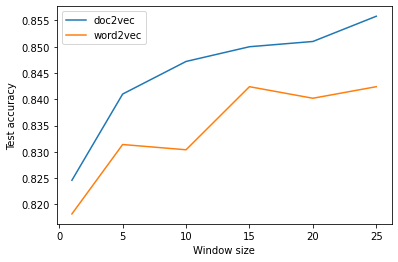

In [52]:
import matplotlib.pyplot as plt
x = [1,5,10,15,20,25]
yw = [e[1] for e in RFw_scores]
yd = [e[1] for e in RFd_scores]

plt.plot(x, yd, label="doc2vec")
plt.plot(x, yw, label="word2vec")
plt.xlabel('Window size')
plt.ylabel('Test accuracy')
plt.legend()
#plt.title('')
plt.show()

## Naive Bayes

link: https://scikit-learn.org/stable/modules/generated/sklearn.naive_bayes.GaussianNB.html#sklearn.naive_bayes.GaussianNB

In [53]:
from sklearn.naive_bayes import GaussianNB
bayes_clf = GaussianNB()

bayes_clf1 = bayes_clf.fit(X_train1, y_train1)
print (f'Word2Vec encoding\n  Train accuracy:{bayes_clf1.score(X_train1, y_train1)}\n  Test accuracy:{bayes_clf1.score(X_test1, y_test1)}')

bayes_clf2 = bayes_clf.fit(X_train2, y_train2)
print (f'Doc2Vec encoding\n  Train accuracy:{bayes_clf2.score(X_train2, y_train2)}\n  Test accuracy:{bayes_clf2.score(X_test2, y_test2)}')

Word2Vec encoding
  Train accuracy:0.7434
  Test accuracy:0.7528
Doc2Vec encoding
  Train accuracy:0.81725
  Test accuracy:0.8224


## SVM

SVM with Linear kernel

In [54]:
# may take an hour for runing this block
from sklearn.svm import SVC

C = 10

svc_clf = SVC(kernel='linear', C=C, probability=True, random_state=0)

svc_clf1 = svc_clf.fit(X_train1, y_train1)
print("Word2Vec encoding Test accuracy:" ,svc_clf1.score(X_test1, y_test1))

svc_clf2 = svc_clf.fit(X_train2, y_train2)
print("Doc2Vec encoding Test accuracy:" ,svc_clf2.score(X_test2, y_test2))

Word2Vec encoding Test accuracy: 0.8778
Doc2Vec encoding Test accuracy: 0.878


In [ ]:
# #Finding the optimum C
# Nc = np.array(range(2, 18) step)

# costs = np.array([best_cost(scaled_2d, i, uniform_random_init) for i in Nc])
# print(costs)
# pl.plot(Nc, costs)
# pl.xlabel('Number of Clusters')
# pl.ylabel('Cost')
# pl.title('Elbow Curve')
# pl.show()

SVG with Gaussian kernel

In [62]:
svc_clf_g = SVC(kernel="rbf", C=10.0, probability=True, random_state=0)

svc_clf_g1 = svc_clf_g.fit(X_train1, y_train1)
print("Word2Vec encoding Test accuracy:" ,svc_clf_g1.score(X_test1, y_test1))

svc_clf_g2 = svc_clf_g.fit(X_train2, y_train2)
print("Doc2Vec encoding Test accuracy:" ,svc_clf_g2.score(X_test2, y_test2))

Word2Vec encoding Test accuracy: 0.8768
Doc2Vec encoding Test accuracy: 0.879


## Logistic regression

word2vec encoding

C parameter:  [1.000000e-05 3.000000e-05 9.000000e-05 2.700000e-04 8.100000e-04
 2.430000e-03 7.290000e-03 2.187000e-02 6.561000e-02 1.968300e-01
 5.904900e-01 1.771470e+00 5.314410e+00 1.594323e+01 4.782969e+01]
[50.095, 52.290000000000006, 67.86, 71.685, 72.45, 73.52499999999999, 75.67, 78.92, 82.205, 84.565, 85.94000000000001, 86.72999999999999, 87.2, 87.335, 87.48]
[49.62, 51.980000000000004, 67.62, 72.64, 73.22, 74.24, 76.12, 79.14, 82.58, 84.89999999999999, 86.02, 87.16000000000001, 87.5, 87.9, 87.82]


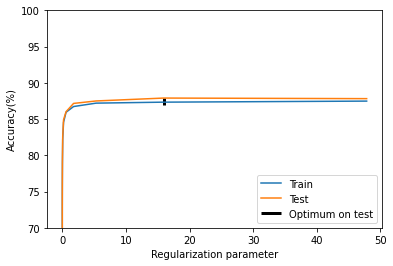

Optimal regularization parameter : 15.943230000000002
Best train_accuracy: 87.480000  Best test_accuracy: 87.900000


In [63]:
from sklearn.linear_model import LogisticRegression
c0=0.00001
alpha=3
cs=[]
for i in range(0, 15, 1):
  cs = np.append(cs,c0*(alpha**i))
print("C parameter: ", cs)

train_errors = list()
test_errors = list()
for c in cs:
    clf = LogisticRegression(C=c, multi_class="multinomial", solver="lbfgs", penalty="l2", max_iter=10000)
    clf.fit(X_train1, y_train1)
    train_errors.append(100*clf.score(X_train1, y_train1))
    test_errors.append(100*clf.score(X_test1, y_test1))

print(train_errors) 
print(test_errors)
i_c_optim = np.argmax(test_errors)
c_optim = cs[i_c_optim]

# Plot results functions

plt.plot(cs, train_errors, label='Train')
plt.plot(cs, test_errors, label='Test')
plt.vlines(c_optim, np.max(test_errors)-1, np.max(test_errors), color='k',
           linewidth=3, label='Optimum on test')
plt.legend(loc='lower right')
plt.ylim([70, 100])
plt.xlabel('Regularization parameter')
plt.ylabel('Accuracy(%)')

plt.show()

print("Optimal regularization parameter : %s" % c_optim)
print("Best train_accuracy: %f  Best test_accuracy: %f" % (np.max(train_errors),np.max(test_errors)))

C parameter:  [1.000000e-05 3.000000e-05 9.000000e-05 2.700000e-04 8.100000e-04
 2.430000e-03 7.290000e-03 2.187000e-02 6.561000e-02 1.968300e-01
 5.904900e-01 1.771470e+00 5.314410e+00 1.594323e+01 4.782969e+01]
[81.215, 81.435, 82.27, 83.56, 85.095, 86.185, 86.83999999999999, 87.13, 87.31, 87.45, 87.55, 87.64, 87.79, 87.76, 87.86500000000001]
[81.58, 82.02000000000001, 82.74000000000001, 84.17999999999999, 85.39999999999999, 86.56, 87.24, 87.5, 87.53999999999999, 87.44, 87.6, 87.62, 87.83999999999999, 88.03999999999999, 87.9]


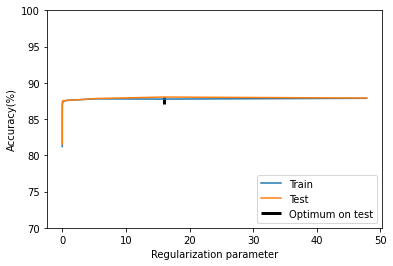

Optimal regularization parameter : 15.943230000000002
Best train_accuracy: 87.865000  Best test_accuracy: 88.040000


In [66]:
c0=0.00001
alpha=3
cs=[]
for i in range(0, 15, 1):
  cs = np.append(cs,c0*(alpha**i))
print("C parameter: ", cs)

train_errors = list()
test_errors = list()
for c in cs:
    clf = LogisticRegression(C=c, multi_class="multinomial", solver="lbfgs", penalty="l2", max_iter=10000)
    clf.fit(X_train2, y_train2)
    train_errors.append(100*clf.score(X_train2, y_train2))
    test_errors.append(100*clf.score(X_test2, y_test2))

print(train_errors) 
print(test_errors)
i_c_optim = np.argmax(test_errors)
c_optim = cs[i_c_optim]

# Plot results functions

plt.plot(cs, train_errors, label='Train')
plt.plot(cs, test_errors, label='Test')
plt.vlines(c_optim, np.max(test_errors)-1, np.max(test_errors), color='k',
           linewidth=3, label='Optimum on test')
plt.legend(loc='lower right')
plt.ylim([70, 100])
plt.xlabel('Regularization parameter')
plt.ylabel('Accuracy(%)')

plt.show()

print("Optimal regularization parameter : %s" % c_optim)
print("Best train_accuracy: %f  Best test_accuracy: %f" % (np.max(train_errors),np.max(test_errors)))